In [62]:
# pip install torch

In [63]:
import torch
print(torch.cuda.is_available()) 
print(torch.version.cuda)

True
12.6


In [64]:
import torch

words = open('names.txt', 'r').read().splitlines()
len(words)

32033

In [65]:
min(len(w) for w in words[:10])

3

In [66]:
max(len(w) for w in words)


15

In [67]:
b = {}
for w in words:
  chs = ['<S>'] + list(w) + ['<E>']
  print(chs, chs[1:])
  for ch1, ch2 in zip(chs, chs[1:]):
    bigram = (ch1, ch2)
    b[bigram] = b.get(bigram, 0) + 1

['<S>', 'e', 'm', 'm', 'a', '<E>'] ['e', 'm', 'm', 'a', '<E>']
['<S>', 'o', 'l', 'i', 'v', 'i', 'a', '<E>'] ['o', 'l', 'i', 'v', 'i', 'a', '<E>']
['<S>', 'a', 'v', 'a', '<E>'] ['a', 'v', 'a', '<E>']
['<S>', 'i', 's', 'a', 'b', 'e', 'l', 'l', 'a', '<E>'] ['i', 's', 'a', 'b', 'e', 'l', 'l', 'a', '<E>']
['<S>', 's', 'o', 'p', 'h', 'i', 'a', '<E>'] ['s', 'o', 'p', 'h', 'i', 'a', '<E>']
['<S>', 'c', 'h', 'a', 'r', 'l', 'o', 't', 't', 'e', '<E>'] ['c', 'h', 'a', 'r', 'l', 'o', 't', 't', 'e', '<E>']
['<S>', 'm', 'i', 'a', '<E>'] ['m', 'i', 'a', '<E>']
['<S>', 'a', 'm', 'e', 'l', 'i', 'a', '<E>'] ['a', 'm', 'e', 'l', 'i', 'a', '<E>']
['<S>', 'h', 'a', 'r', 'p', 'e', 'r', '<E>'] ['h', 'a', 'r', 'p', 'e', 'r', '<E>']
['<S>', 'e', 'v', 'e', 'l', 'y', 'n', '<E>'] ['e', 'v', 'e', 'l', 'y', 'n', '<E>']
['<S>', 'a', 'b', 'i', 'g', 'a', 'i', 'l', '<E>'] ['a', 'b', 'i', 'g', 'a', 'i', 'l', '<E>']
['<S>', 'e', 'm', 'i', 'l', 'y', '<E>'] ['e', 'm', 'i', 'l', 'y', '<E>']
['<S>', 'e', 'l', 'i', 'z', 'a', '

In [68]:
sorted(b.items(), key = lambda kv: -kv[1])  # 把所有 bigram 按照出现次数从大到小排序

[(('n', '<E>'), 6763),
 (('a', '<E>'), 6640),
 (('a', 'n'), 5438),
 (('<S>', 'a'), 4410),
 (('e', '<E>'), 3983),
 (('a', 'r'), 3264),
 (('e', 'l'), 3248),
 (('r', 'i'), 3033),
 (('n', 'a'), 2977),
 (('<S>', 'k'), 2963),
 (('l', 'e'), 2921),
 (('e', 'n'), 2675),
 (('l', 'a'), 2623),
 (('m', 'a'), 2590),
 (('<S>', 'm'), 2538),
 (('a', 'l'), 2528),
 (('i', '<E>'), 2489),
 (('l', 'i'), 2480),
 (('i', 'a'), 2445),
 (('<S>', 'j'), 2422),
 (('o', 'n'), 2411),
 (('h', '<E>'), 2409),
 (('r', 'a'), 2356),
 (('a', 'h'), 2332),
 (('h', 'a'), 2244),
 (('y', 'a'), 2143),
 (('i', 'n'), 2126),
 (('<S>', 's'), 2055),
 (('a', 'y'), 2050),
 (('y', '<E>'), 2007),
 (('e', 'r'), 1958),
 (('n', 'n'), 1906),
 (('y', 'n'), 1826),
 (('k', 'a'), 1731),
 (('n', 'i'), 1725),
 (('r', 'e'), 1697),
 (('<S>', 'd'), 1690),
 (('i', 'e'), 1653),
 (('a', 'i'), 1650),
 (('<S>', 'r'), 1639),
 (('a', 'm'), 1634),
 (('l', 'y'), 1588),
 (('<S>', 'l'), 1572),
 (('<S>', 'c'), 1542),
 (('<S>', 'e'), 1531),
 (('j', 'a'), 1473),
 (

In [69]:
import torch


In [70]:
N = torch.zeros((27, 27), dtype = torch.int32)
print(N.size())

torch.Size([27, 27])


In [71]:
print(''.join(words))
chars = sorted(list(set(''.join(words))))
print(chars)

stoi = {s:i+1 for i,s in enumerate(chars)}
print(stoi)
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}
print(itos)

emmaoliviaavaisabellasophiacharlottemiaameliaharperevelynabigailemilyelizabethmilaellaaverysofiacamilaariascarlettvictoriamadisonlunagracechloepenelopelaylarileyzoeynoralilyeleanorhannahlillianaddisonaubreyelliestellanataliezoeleahhazelvioletaurorasavannahaudreybrooklynbellaclaireskylarlucypaisleyeverlyannacarolinenovagenesisemiliakennedysamanthamayawillowkinsleynaomiaaliyahelenasaraharianaallisongabriellaalicemadelyncorarubyevaserenityautumnadelinehaileygiannavalentinaislaelianaquinnnevaehivysadiepiperlydiaalexajosephineemeryjuliadelilahariannaviviankayleesophiebriellemadelinepeytonryleeclarahadleymelaniemackenziereaganadalynnlilianaaubreejadekatherineisabellenataliaraelynnmariaathenaximenaaryaleilanitaylorfaithrosekyliealexandramarymargaretlylaashleyamayaelizabriannabaileyandreakhloejasminemelodyirisisabelnorahannabellevaleriaemersonadalynryleighedenemersynanastasiakaylaalyssajulianacharlieestherarielceciliavaleriealinamollyreesealiyahlillyparkerfinleymorgansydneyjordyneloisetrinityd

In [72]:
for w in words:
  chs = ['.'] + list(w) + ['.']
  print(chs)
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    N[ix1, ix2] += 1   # 建立一个数组，统计每一种二元对出现的次数

['.', 'e', 'm', 'm', 'a', '.']
['.', 'o', 'l', 'i', 'v', 'i', 'a', '.']
['.', 'a', 'v', 'a', '.']
['.', 'i', 's', 'a', 'b', 'e', 'l', 'l', 'a', '.']
['.', 's', 'o', 'p', 'h', 'i', 'a', '.']
['.', 'c', 'h', 'a', 'r', 'l', 'o', 't', 't', 'e', '.']
['.', 'm', 'i', 'a', '.']
['.', 'a', 'm', 'e', 'l', 'i', 'a', '.']
['.', 'h', 'a', 'r', 'p', 'e', 'r', '.']
['.', 'e', 'v', 'e', 'l', 'y', 'n', '.']
['.', 'a', 'b', 'i', 'g', 'a', 'i', 'l', '.']
['.', 'e', 'm', 'i', 'l', 'y', '.']
['.', 'e', 'l', 'i', 'z', 'a', 'b', 'e', 't', 'h', '.']
['.', 'm', 'i', 'l', 'a', '.']
['.', 'e', 'l', 'l', 'a', '.']
['.', 'a', 'v', 'e', 'r', 'y', '.']
['.', 's', 'o', 'f', 'i', 'a', '.']
['.', 'c', 'a', 'm', 'i', 'l', 'a', '.']
['.', 'a', 'r', 'i', 'a', '.']
['.', 's', 'c', 'a', 'r', 'l', 'e', 't', 't', '.']
['.', 'v', 'i', 'c', 't', 'o', 'r', 'i', 'a', '.']
['.', 'm', 'a', 'd', 'i', 's', 'o', 'n', '.']
['.', 'l', 'u', 'n', 'a', '.']
['.', 'g', 'r', 'a', 'c', 'e', '.']
['.', 'c', 'h', 'l', 'o', 'e', '.']
['.', 'p',

(np.float64(-0.5), np.float64(26.5), np.float64(26.5), np.float64(-0.5))

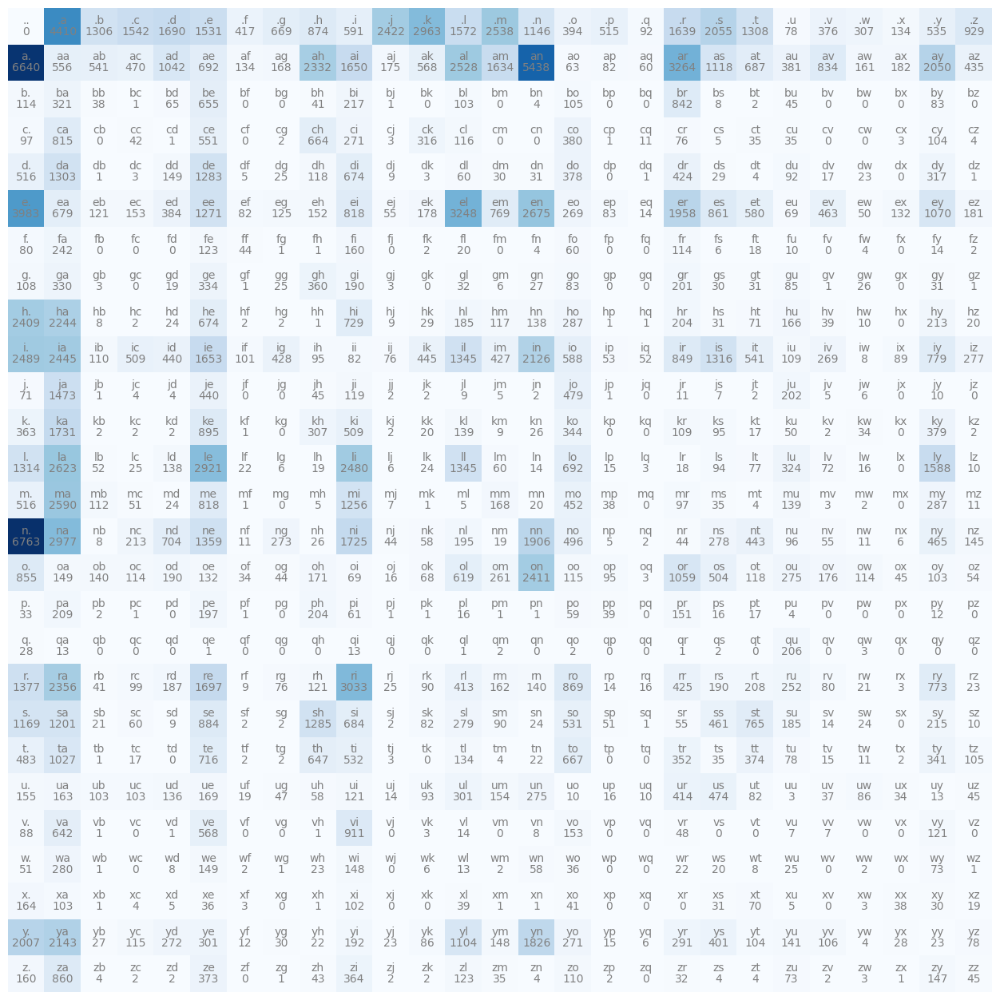

In [73]:
import matplotlib.pyplot as plt
%matplotlib inline

# 可视化相邻字符对出现的次数
plt.figure(figsize=(16, 16))
plt.imshow(N, cmap='Blues')
for i in range(27):
    for j in range(27):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha="center", va="bottom", color='gray')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='gray')
plt.axis('off')

In [74]:
p = N[0].float()
p = p / p.sum()
p
print(p)  # . + char 意味着首字符的概率
print(p.sum())

tensor([0.0000, 0.1377, 0.0408, 0.0481, 0.0528, 0.0478, 0.0130, 0.0209, 0.0273,
        0.0184, 0.0756, 0.0925, 0.0491, 0.0792, 0.0358, 0.0123, 0.0161, 0.0029,
        0.0512, 0.0642, 0.0408, 0.0024, 0.0117, 0.0096, 0.0042, 0.0167, 0.0290])
tensor(1.)


In [75]:
g = torch.Generator().manual_seed(2147483647)
ix = torch.multinomial(p, num_samples=10, replacement=True, generator=g)
#ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
print(ix)
#itos[ix]

tensor([13, 19, 14,  1,  1, 20, 20,  1, 13, 13])


In [76]:
g = torch.Generator().manual_seed(2147483647)
p = torch.rand(3, generator=g)
print(p)
p = p / p.sum()
p

tensor([0.7081, 0.3542, 0.1054])


tensor([0.6064, 0.3033, 0.0903])

In [77]:
torch.multinomial(p, num_samples=10, replacement=True, generator=g)

tensor([1, 1, 2, 0, 0, 2, 1, 1, 0, 0])

In [78]:
p.shape

torch.Size([3])

In [79]:
print(N)

tensor([[   0, 4410, 1306, 1542, 1690, 1531,  417,  669,  874,  591, 2422, 2963,
         1572, 2538, 1146,  394,  515,   92, 1639, 2055, 1308,   78,  376,  307,
          134,  535,  929],
        [6640,  556,  541,  470, 1042,  692,  134,  168, 2332, 1650,  175,  568,
         2528, 1634, 5438,   63,   82,   60, 3264, 1118,  687,  381,  834,  161,
          182, 2050,  435],
        [ 114,  321,   38,    1,   65,  655,    0,    0,   41,  217,    1,    0,
          103,    0,    4,  105,    0,    0,  842,    8,    2,   45,    0,    0,
            0,   83,    0],
        [  97,  815,    0,   42,    1,  551,    0,    2,  664,  271,    3,  316,
          116,    0,    0,  380,    1,   11,   76,    5,   35,   35,    0,    0,
            3,  104,    4],
        [ 516, 1303,    1,    3,  149, 1283,    5,   25,  118,  674,    9,    3,
           60,   30,   31,  378,    0,    1,  424,   29,    4,   92,   17,   23,
            0,  317,    1],
        [3983,  679,  121,  153,  384, 1271,   82,

In [80]:
P = N[0].float()
print(P)

tensor([   0., 4410., 1306., 1542., 1690., 1531.,  417.,  669.,  874.,  591.,
        2422., 2963., 1572., 2538., 1146.,  394.,  515.,   92., 1639., 2055.,
        1308.,   78.,  376.,  307.,  134.,  535.,  929.])


In [81]:
P = (N + 1).float()
P = P / P.sum(1, keepdim=True)
print(P)

tensor([[3.1192e-05, 1.3759e-01, 4.0767e-02, 4.8129e-02, 5.2745e-02, 4.7785e-02,
         1.3038e-02, 2.0898e-02, 2.7293e-02, 1.8465e-02, 7.5577e-02, 9.2452e-02,
         4.9064e-02, 7.9195e-02, 3.5777e-02, 1.2321e-02, 1.6095e-02, 2.9008e-03,
         5.1154e-02, 6.4130e-02, 4.0830e-02, 2.4641e-03, 1.1759e-02, 9.6070e-03,
         4.2109e-03, 1.6719e-02, 2.9008e-02],
        [1.9583e-01, 1.6425e-02, 1.5983e-02, 1.3889e-02, 3.0756e-02, 2.0435e-02,
         3.9809e-03, 4.9835e-03, 6.8796e-02, 4.8685e-02, 5.1899e-03, 1.6779e-02,
         7.4575e-02, 4.8213e-02, 1.6039e-01, 1.8872e-03, 2.4475e-03, 1.7988e-03,
         9.6279e-02, 3.2997e-02, 2.0288e-02, 1.1264e-02, 2.4623e-02, 4.7771e-03,
         5.3963e-03, 6.0480e-02, 1.2857e-02],
        [4.3039e-02, 1.2051e-01, 1.4596e-02, 7.4850e-04, 2.4701e-02, 2.4551e-01,
         3.7425e-04, 3.7425e-04, 1.5719e-02, 8.1587e-02, 7.4850e-04, 3.7425e-04,
         3.8922e-02, 3.7425e-04, 1.8713e-03, 3.9671e-02, 3.7425e-04, 3.7425e-04,
         3.1549e-

In [82]:
P[0].sum()
print(P[0].sum())
print(P[1].sum())
print(P[2].sum())
print(P[26].sum())

tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.0000)


In [83]:
g = torch.Generator().manual_seed(2147483647+2)
""" 根据预先统计的概率来随机采样，生成五个名字 """
for i in range(10):
  
  out = []
  ix = 0
  while True:
    p = P[ix]
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    if ix == 0:
      break
  print(''.join(out))

# 这样生成的名字会符合训练数据中字符对的统计规律，所以说 bigram 是用人工统计的方式来学习，相当于模型参数
# 是人工统计的，并不是让模型自己学习

tayen.
aya.
jelievillaxa.
riran.
alanan.
ken.
ken.
lonniay.
zamas.
jete.


In [84]:
import torch
g = torch.Generator().manual_seed(2147483647+7)

# 生成随机概率分布（确保和为1）
n = 100  # 类别数量
p = torch.rand(n, generator=g)  # 生成随机数
p = p / p.sum()  # 归一化为概率分布

print(p)

torch.multinomial(p, num_samples=1, replacement=True, generator=g)

tensor([0.0035, 0.0192, 0.0104, 0.0160, 0.0177, 0.0046, 0.0176, 0.0063, 0.0189,
        0.0009, 0.0179, 0.0163, 0.0009, 0.0015, 0.0072, 0.0166, 0.0187, 0.0100,
        0.0052, 0.0177, 0.0029, 0.0014, 0.0060, 0.0079, 0.0103, 0.0131, 0.0079,
        0.0175, 0.0139, 0.0099, 0.0032, 0.0145, 0.0118, 0.0137, 0.0095, 0.0174,
        0.0082, 0.0023, 0.0005, 0.0186, 0.0097, 0.0062, 0.0118, 0.0033, 0.0083,
        0.0149, 0.0037, 0.0160, 0.0074, 0.0130, 0.0090, 0.0022, 0.0008, 0.0080,
        0.0089, 0.0085, 0.0066, 0.0040, 0.0079, 0.0061, 0.0031, 0.0035, 0.0174,
        0.0094, 0.0022, 0.0058, 0.0161, 0.0120, 0.0031, 0.0012, 0.0137, 0.0186,
        0.0110, 0.0006, 0.0078, 0.0047, 0.0110, 0.0104, 0.0135, 0.0085, 0.0101,
        0.0080, 0.0128, 0.0095, 0.0193, 0.0010, 0.0138, 0.0120, 0.0112, 0.0092,
        0.0157, 0.0103, 0.0143, 0.0108, 0.0185, 0.0188, 0.0162, 0.0194, 0.0074,
        0.0144])


tensor([77])


   $$P(i) = \frac{p_i}{\sum_{j=1}^n p_j}$$


In [85]:
N[0]

tensor([   0, 4410, 1306, 1542, 1690, 1531,  417,  669,  874,  591, 2422, 2963,
        1572, 2538, 1146,  394,  515,   92, 1639, 2055, 1308,   78,  376,  307,
         134,  535,  929], dtype=torch.int32)

In [86]:
p = N[0].float()
p = p / p.sum()
p
print(len(N))
print(len(N[0]))
print(N[0][0].item())
print(N[0][2].item())

27
27
0
1306


In [87]:
# GOAL: maximize likelihood of the data w.r.t. model parameters (statistical modeling)
# equivalent to maximizing the log likelihood (because log is monotonic)
# equivalent to minimizing the negative log likelihood
# equivalent to minimizing the average negative log likelihood

# log(a*b*c) = log(a) + log(b) + log(c)

In [88]:
log_likelihood = 0.0  # 累积对数似然值
n = 0  # 总样本计数

for w in words:  # 遍历所有训练单词
    chs = ['.'] + list(w) + ['.']  # 给单词添加开始和结束标记
    for ch1, ch2 in zip(chs, chs[1:]):  # 遍历所有连续字符对
        ix1 = stoi[ch1]  # 将字符转换为索引（使用预建的字符到索引映射）
        ix2 = stoi[ch2]  # 同上
        prob = P[ix1, ix2]  # 从概率矩阵P中获取转移概率
        logprob = torch.log(prob)  # 计算对数概率
        print(n,"times", logprob)
        log_likelihood += logprob  # 累加到总对数似然
        n += 1  # 计数器递增

print(f'{log_likelihood=}')  # 输出总对数似然
nll = -log_likelihood  # 计算负对数似然
print(f'{nll=}')  # 输出负对数似然，
print(f'{nll/n}') # 后续训练目标是最小化这个值

# 这是使用人工学习的方法，评估最后的学习效果，
# 后面要用神经网络方法进行学习，然后再比较学习效果

0 times tensor(-3.0410)
1 times tensor(-3.2793)
2 times tensor(-3.6753)
3 times tensor(-0.9454)
4 times tensor(-1.6305)
5 times tensor(-4.3965)
6 times tensor(-2.5526)
7 times tensor(-1.7293)
8 times tensor(-4.1845)
9 times tensor(-1.0476)
10 times tensor(-1.9807)
11 times tensor(-1.6305)
12 times tensor(-1.9835)
13 times tensor(-3.7041)
14 times tensor(-1.3971)
15 times tensor(-1.6305)
16 times tensor(-3.9919)
17 times tensor(-2.5998)
18 times tensor(-1.9119)
19 times tensor(-4.1363)
20 times tensor(-1.4044)
21 times tensor(-1.8396)
22 times tensor(-2.3408)
23 times tensor(-1.6733)
24 times tensor(-1.6305)
25 times tensor(-2.7468)
26 times tensor(-2.7270)
27 times tensor(-4.4180)
28 times tensor(-1.6364)
29 times tensor(-2.3485)
30 times tensor(-1.9807)
31 times tensor(-1.6305)
32 times tensor(-3.0339)
33 times tensor(-1.6774)
34 times tensor(-1.2251)
35 times tensor(-2.3405)
36 times tensor(-3.4256)
37 times tensor(-3.0047)
38 times tensor(-4.2032)
39 times tensor(-2.7031)
40 times t

In [89]:
# 接下来使用神经网络的方式进行学习
# create the training set of bigrams (x,y)
xs, ys = [], []

for w in words[:1]:
  chs = ['.'] + list(w) + ['.']
  print(chs)
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    print(ch1, ch2)
    xs.append(ix1)
    ys.append(ix2)
    
xs = torch.tensor(xs)
ys = torch.tensor(ys)

['.', 'e', 'm', 'm', 'a', '.']
. e
e m
m m
m a
a .


In [90]:
xs

tensor([ 0,  5, 13, 13,  1])

In [91]:
ys

tensor([ 5, 13, 13,  1,  0])

In [92]:
import torch.nn.functional as F
xenc = F.one_hot(xs, num_classes=27).float()
xenc

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [93]:
xenc.shape

torch.Size([5, 27])

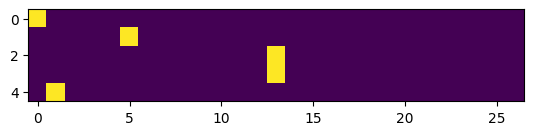

In [94]:
plt.imshow(xenc)

In [95]:
xenc.dtype

torch.float32

In [96]:
W = torch.randn((27,27))
xenc @ W

tensor([[ 1.4394,  0.4142,  0.7235, -0.6862, -0.5680,  1.1106, -0.7681, -0.3638,
          0.3315,  0.8712,  0.1957, -0.5617, -2.0428, -1.7604, -0.4378,  0.3326,
         -0.4078,  0.6172,  2.0850, -0.3098, -0.8819, -0.0191, -1.1966, -0.1929,
          1.9292,  1.6250, -0.0144],
        [-0.3836,  1.1920,  0.4376, -1.3215,  0.0057, -0.1888,  1.1328, -1.2126,
         -1.9068,  1.3611, -0.9139,  1.1917, -1.5285,  2.2228, -1.8246, -0.4468,
          0.7411,  0.0213,  0.3586,  2.3971, -0.6567,  0.5050, -0.3970,  0.6397,
         -0.7356,  1.5300, -0.2801],
        [-0.5288, -0.5379, -0.9280, -1.0263, -0.6130, -1.9889,  0.3492,  0.7671,
         -0.1894,  0.5520,  0.0759,  1.0800,  1.6506,  0.5089,  0.4305, -0.0579,
         -0.1832, -0.9158, -1.4021,  1.3215, -0.7254,  1.2194,  0.8257,  0.2911,
          0.5880, -0.4025,  0.2454],
        [-0.5288, -0.5379, -0.9280, -1.0263, -0.6130, -1.9889,  0.3492,  0.7671,
         -0.1894,  0.5520,  0.0759,  1.0800,  1.6506,  0.5089,  0.4305, -0.0579

In [97]:
logits = xenc @ W # log-counts
counts = logits.exp() # equivalent N
print(counts)
probs = counts / counts.sum(1, keepdims=True)
probs

tensor([[ 4.2181,  1.5131,  2.0617,  0.5035,  0.5667,  3.0361,  0.4639,  0.6950,
          1.3931,  2.3898,  1.2161,  0.5702,  0.1297,  0.1720,  0.6454,  1.3946,
          0.6651,  1.8538,  8.0444,  0.7336,  0.4140,  0.9811,  0.3022,  0.8246,
          6.8841,  5.0784,  0.9857],
        [ 0.6814,  3.2936,  1.5490,  0.2667,  1.0057,  0.8280,  3.1044,  0.2974,
          0.1486,  3.9006,  0.4010,  3.2926,  0.2169,  9.2336,  0.1613,  0.6397,
          2.0983,  1.0215,  1.4313, 10.9909,  0.5185,  1.6571,  0.6723,  1.8958,
          0.4792,  4.6183,  0.7557],
        [ 0.5893,  0.5840,  0.3953,  0.3583,  0.5417,  0.1368,  1.4179,  2.1534,
          0.8274,  1.7368,  1.0789,  2.9447,  5.2101,  1.6635,  1.5380,  0.9438,
          0.8326,  0.4002,  0.2461,  3.7490,  0.4842,  3.3853,  2.2836,  1.3379,
          1.8004,  0.6687,  1.2781],
        [ 0.5893,  0.5840,  0.3953,  0.3583,  0.5417,  0.1368,  1.4179,  2.1534,
          0.8274,  1.7368,  1.0789,  2.9447,  5.2101,  1.6635,  1.5380,  0.9438

tensor([[0.0884, 0.0317, 0.0432, 0.0105, 0.0119, 0.0636, 0.0097, 0.0146, 0.0292,
         0.0501, 0.0255, 0.0119, 0.0027, 0.0036, 0.0135, 0.0292, 0.0139, 0.0388,
         0.1685, 0.0154, 0.0087, 0.0206, 0.0063, 0.0173, 0.1442, 0.1064, 0.0206],
        [0.0124, 0.0597, 0.0281, 0.0048, 0.0182, 0.0150, 0.0563, 0.0054, 0.0027,
         0.0707, 0.0073, 0.0597, 0.0039, 0.1674, 0.0029, 0.0116, 0.0380, 0.0185,
         0.0259, 0.1993, 0.0094, 0.0300, 0.0122, 0.0344, 0.0087, 0.0837, 0.0137],
        [0.0153, 0.0151, 0.0102, 0.0093, 0.0140, 0.0035, 0.0367, 0.0558, 0.0214,
         0.0450, 0.0280, 0.0763, 0.1350, 0.0431, 0.0399, 0.0245, 0.0216, 0.0104,
         0.0064, 0.0972, 0.0125, 0.0877, 0.0592, 0.0347, 0.0467, 0.0173, 0.0331],
        [0.0153, 0.0151, 0.0102, 0.0093, 0.0140, 0.0035, 0.0367, 0.0558, 0.0214,
         0.0450, 0.0280, 0.0763, 0.1350, 0.0431, 0.0399, 0.0245, 0.0216, 0.0104,
         0.0064, 0.0972, 0.0125, 0.0877, 0.0592, 0.0347, 0.0467, 0.0173, 0.0331],
        [0.0664, 0.0157,

In [98]:
probs[0]

tensor([0.0884, 0.0317, 0.0432, 0.0105, 0.0119, 0.0636, 0.0097, 0.0146, 0.0292,
        0.0501, 0.0255, 0.0119, 0.0027, 0.0036, 0.0135, 0.0292, 0.0139, 0.0388,
        0.1685, 0.0154, 0.0087, 0.0206, 0.0063, 0.0173, 0.1442, 0.1064, 0.0206])

In [99]:
probs[0].shape


torch.Size([27])

In [100]:
probs[0].sum()

tensor(1.)

In [101]:
xs

tensor([ 0,  5, 13, 13,  1])

In [102]:
ys

tensor([ 5, 13, 13,  1,  0])

In [103]:
# randomly initialize 27 neurons' weights. each neuron receives 27 inputs
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g)

In [104]:
xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
logits = xenc @ W # predict log-counts
counts = logits.exp() # counts, equivalent to N
probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
# btw: the last 2 lines here are together called a 'softmax'

In [105]:
probs.shape

torch.Size([5, 27])

In [106]:
nlls = torch.zeros(5)
for i in range(5):
  # i-th bigram:
  x = xs[i].item() # input character index
  y = ys[i].item() # label character index
  print('--------')
  print(f'bigram example {i+1}: {itos[x]}{itos[y]} (indexes {x},{y})')
  print('input to the neural net:', x)
  print('output probabilities from the neural net:', probs[i])
  print('label (actual next character):', y)
  p = probs[i, y]
  print('probability assigned by the net to the the correct character:', p.item())
  logp = torch.log(p) # p 的概率小于 1，因此计算 log 之后值为负，
  print('log likelihood:', logp.item())
  nll = -logp         # 为了将问题转化为最小化 loss 问题，需要取负对数似然
  print('negative log likelihood:', nll.item())
  nlls[i] = nll

print('=========')
print('average negative log likelihood, i.e. loss =', nlls.mean().item())

--------
bigram example 1: .e (indexes 0,5)
input to the neural net: 0
output probabilities from the neural net: tensor([0.0607, 0.0100, 0.0123, 0.0042, 0.0168, 0.0123, 0.0027, 0.0232, 0.0137,
        0.0313, 0.0079, 0.0278, 0.0091, 0.0082, 0.0500, 0.2378, 0.0603, 0.0025,
        0.0249, 0.0055, 0.0339, 0.0109, 0.0029, 0.0198, 0.0118, 0.1537, 0.1459])
label (actual next character): 5
probability assigned by the net to the the correct character: 0.01228625513613224
log likelihood: -4.399273872375488
negative log likelihood: 4.399273872375488
--------
bigram example 2: em (indexes 5,13)
input to the neural net: 5
output probabilities from the neural net: tensor([0.0290, 0.0796, 0.0248, 0.0521, 0.1989, 0.0289, 0.0094, 0.0335, 0.0097,
        0.0301, 0.0702, 0.0228, 0.0115, 0.0181, 0.0108, 0.0315, 0.0291, 0.0045,
        0.0916, 0.0215, 0.0486, 0.0300, 0.0501, 0.0027, 0.0118, 0.0022, 0.0472])
label (actual next character): 13
probability assigned by the net to the the correct character: 0.

In [107]:
# 接下来准备开始训练模型，以学习参数

In [108]:
xs

tensor([ 0,  5, 13, 13,  1])

In [109]:
ys

tensor([ 5, 13, 13,  1,  0])

In [110]:
# randomly initialize 27 neurons' weights. each neuron receives 27 inputs
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

In [111]:
# forward pass
xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
logits = xenc @ W # predict log-counts
counts = logits.exp() # counts, equivalent to N
probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
loss = -probs[torch.arange(5), ys].log().mean()

In [112]:
print(loss.item())

3.7693049907684326


In [113]:
W.grad = None
loss.backward()

In [114]:
W.data += -0.1 * W.grad

In [115]:
# 使用更多数据集来训练

In [116]:
# create the dataset
xs, ys = [], []
for w in words:
  chs = ['.'] + list(w) + ['.']
  for ch1, ch2 in zip(chs, chs[1:]):
    ix1 = stoi[ch1]
    ix2 = stoi[ch2]
    xs.append(ix1)
    ys.append(ix2)
xs = torch.tensor(xs)
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples: ', num)

# initialize the 'network'
g = torch.Generator().manual_seed(2147483647)
W = torch.randn((27, 27), generator=g, requires_grad=True)

number of examples:  228146


In [117]:
# gradient descent
for k in range(100):
  
  # forward pass
  xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoding
  logits = xenc @ W # predict log-counts
  counts = logits.exp() # counts, equivalent to N
  probs = counts / counts.sum(1, keepdims=True) # probabilities for next character
  loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean()
  print(loss.item())
  
  # backward pass
  W.grad = None # set to zero the gradient
  loss.backward()
  
  # update
  W.data += -30 * W.grad

3.7686190605163574
3.5176963806152344
3.3397202491760254
3.2095839977264404
3.1127052307128906
3.0375256538391113
2.9771223068237305
2.92763090133667
2.8865277767181396
2.8519561290740967
2.822500705718994
2.797088146209717
2.7749063968658447
2.755342483520508
2.737929105758667
2.722306728363037
2.708200693130493
2.6953916549682617
2.683708429336548
2.673011064529419
2.663184881210327
2.65413498878479
2.645780324935913
2.6380512714385986
2.630887269973755
2.624234914779663
2.6180460453033447
2.612278938293457
2.606895685195923
2.6018621921539307
2.5971477031707764
2.5927255153656006
2.5885701179504395
2.5846598148345947
2.5809743404388428
2.577495813369751
2.574207305908203
2.5710947513580322
2.5681440830230713
2.5653440952301025
2.56268310546875
2.5601518154144287
2.557741165161133
2.5554423332214355
2.553248882293701
2.5511534214019775
2.549149513244629
2.5472323894500732
2.5453970432281494
2.543637752532959
2.5419504642486572
2.5403316020965576
2.5387778282165527
2.5372843742370605


In [118]:
# finally, sample from the 'neural net' model
g = torch.Generator().manual_seed(2147483647+5)

for i in range(10):
  
  out = []
  ix = 0
  while True:
    
    # ----------
    # BEFORE:
    #p = P[ix]
    # ----------
    # NOW:
    xenc = F.one_hot(torch.tensor([ix]), num_classes=27).float()
    logits = xenc @ W # predict log-counts
    counts = logits.exp() # counts, equivalent to N
    p = counts / counts.sum(1, keepdims=True) # probabilities for next character
    # ----------
    
    ix = torch.multinomial(p, num_samples=1, replacement=True, generator=g).item()
    out.append(itos[ix])
    
    if ix == 0:
      break
  print(''.join(out))

jazayl.
tahaxchvan.
shaseylylya.
deleylalindoneia.
beryawvbia.
reonans.
en.
miufazlilabevwfialatjarilinn.
blidiys.
ghue.


In [119]:

print(f"CUDA available: {torch.cuda.is_available()}")


CUDA available: True


In [2]:
# 在代码中添加设备检查
prob = P[ix1, ix2]
print(prob.device)  # 应该显示'cuda:0'

logprob = torch.log(prob)
print(logprob.device)  # 应该显示'cuda:0'

NameError: name 'P' is not defined

In [10]:
import torch
# 在概率矩阵P创建时指定设备
P = torch.zeros((50000, 50000), device='cuda')  # 初始创建在GPU
# 或者将现有张量转移到GPU
P = P.to('cuda') 

# 后续所有计算将自动在GPU执行

# 在代码中添加设备检查
print(P.device)  # 应该显示'cuda:0'

cuda:0


In [6]:
import time

# CPU版本
start = time.time()
# ...执行计算...
cpu_time = time.time() - start

# GPU版本
P = P.to('cuda')
start = time.time()
# ...执行相同计算...
gpu_time = time.time() - start

print(f"CPU time: {cpu_time:.4f}s, GPU time: {gpu_time:.4f}s")

CPU time: 0.0000s, GPU time: 0.0000s


In [19]:
import torch
import time

# 配置参数
M, N, K = 5000, 2000, 5000  # 矩阵尺寸 (M, K) @ (K, N)
NUM_RUNS = 100               # 运行次数

def benchmark_matrix_mul(device='cpu', num_runs=1000):
    try:
        # 初始化矩阵（统一在CPU创建）
        A_cpu = torch.randn(M, K)
        B_cpu = torch.randn(K, N)
        
        # 数据转移计时
        transfer_start = time.time()
        A = A_cpu.to(device)
        B = B_cpu.to(device)
        if device == 'cuda':
            torch.cuda.synchronize()
        transfer_time = time.time() - transfer_start
        
        # 预热（不纳入计时）
        _ = torch.mm(A[:10, :10], B[:10, :10])
        if device == 'cuda':
            torch.cuda.synchronize()
        
        # 正式计时
        compute_start = time.time()
        for _ in range(num_runs):
            C = torch.mm(A, B)  # 实际计算
            if device == 'cuda':
                torch.cuda.synchronize()  # 确保每次计算完成
        total_compute_time = time.time() - compute_start
        
        # 验证最后一次结果
        checksum = C.norm().item()
        return transfer_time, total_compute_time, checksum
    
    except RuntimeError as e:
        if 'CUDA out of memory' in str(e):
            print(f"内存不足！请尝试减小矩阵尺寸（当前：{M}x{K} @ {K}x{N}）")
            print("建议调整：M, N, K = 10000, 200, 10000")
        else:
            print(f"运行时错误：{str(e)}")
        return None

# 执行测试
print(f"正在测试 {NUM_RUNS} 次矩阵乘法 ({M}x{K} @ {K}x{N})...")

# CPU测试
cpu_transfer, cpu_time, cpu_check = benchmark_matrix_mul('cpu', NUM_RUNS)
if cpu_time:
    print(f"\nCPU结果:")
    print(f"  - 数据传输: {cpu_transfer:.4f}s")
    print(f"  - 总计算时间: {cpu_time:.2f}s")
    print(f"  - 单次平均时间: {cpu_time/NUM_RUNS:.4f}s")
    print(f"  - 结果校验值: {cpu_check:.2f}")

# CUDA测试
if torch.cuda.is_available():
    cuda_result = benchmark_matrix_mul('cuda', NUM_RUNS)
    if cuda_result:
        cuda_transfer, cuda_time, cuda_check = cuda_result
        print(f"\nCUDA结果:")
        print(f"  - 数据传输: {cuda_transfer:.4f}s")
        print(f"  - 总计算时间: {cuda_time:.2f}s")
        print(f"  - 单次平均时间: {cuda_time/NUM_RUNS:.6f}s")
        print(f"  - 结果校验值: {cuda_check:.2f}")
        print(f"\n性能对比:")
        print(f"  总加速比: {cpu_time / cuda_time:.1f}x")
        print(f"  单次加速比: {(cpu_time/NUM_RUNS) / (cuda_time/NUM_RUNS):.1f}x")
else:
    print("\nCUDA不可用")

# 内存清理
if torch.cuda.is_available():
    torch.cuda.empty_cache()

正在测试 100 次矩阵乘法 (5000x5000 @ 5000x2000)...

CPU结果:
  - 数据传输: 0.0000s
  - 总计算时间: 12.48s
  - 单次平均时间: 0.1248s
  - 结果校验值: 223591.27

CUDA结果:
  - 数据传输: 0.0284s
  - 总计算时间: 1.15s
  - 单次平均时间: 0.011468s
  - 结果校验值: 223680.06

性能对比:
  总加速比: 10.9x
  单次加速比: 10.9x
